In [1]:
import time
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
import lightgbm as lgb
import tensorflow as tf

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [2]:
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **EXPLORATORY DATA ANALYSIS**

In [4]:
# df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/water_quality_variables_data_lake_victoria.csv')
df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/AI and DS Project/Project_Dataset/water_quality_parameters_data_lake_victoria.csv')

In [5]:
# Display first few rows
df.head()

,id,ndci,ndti,ndvi,temperature,precipitation,date,time,longitude,latitude
0,0,0.101512,-0.427785,-0.280000,25.474069,0.004637,2019-01-02,08:10:26,33.950132,-0.991945
1,1,0.166667,-0.361446,-0.258907,25.474069,0.004637,2019-01-02,08:10:26,33.958209,-0.952864
2,2,0.053957,-0.414905,-0.335025,25.351022,0.023651,2019-01-02,08:10:26,33.961437,-0.925996
3,3,-0.028939,-0.320595,-0.221374,25.351022,0.023651,2019-01-02,08:10:26,33.985340,-0.923366
4,4,0.062706,-0.336449,-0.193277,25.351022,0.023651,2019-01-02,08:10:26,33.969162,-0.914868


In [6]:
# Display data types and non-null counts
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23349 entries, 0 to 23348
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             23349 non-null  int64  
 1   ndci           23349 non-null  float64
 2   ndti           23349 non-null  float64
 3   ndvi           23349 non-null  float64
 4   temperature    23349 non-null  float64
 5   precipitation  23349 non-null  float64
 6   date           23349 non-null  object 
 7   time           23349 non-null  object 
 8   longitude      23349 non-null  float64
 9   latitude       23349 non-null  float64
dtypes: float64(7), int64(1), object(2)
memory usage: 1.8+ MB


In [7]:
# Summary statistics
df.describe()

,id,ndci,ndti,ndvi,temperature,precipitation,longitude,latitude
count,23349.000000,23349.000000,23349.000000,23349.000000,23349.000000,23349.000000,23349.000000,23349.000000
mean,1896.626879,0.032464,-0.213198,-0.235647,24.481165,0.838118,34.183471,-0.457424
std,1347.826667,0.103447,0.107922,0.193206,1.314232,1.703644,0.272232,0.325797
min,0.000000,-0.811321,-0.983333,-1.000000,20.917078,0.000000,33.923439,-0.991945
25%,833.000000,-0.024055,-0.284738,-0.341615,23.525354,0.001013,33.982700,-0.803050
50%,1667.000000,0.009390,-0.217742,-0.229268,24.294382,0.124156,34.054342,-0.374527
75%,2634.000000,0.053061,-0.144444,-0.148688,25.212350,0.850640,34.380654,-0.239875
max,5809.000000,0.846154,0.310591,0.908096,31.393823,15.167350,34.834401,0.182955


In [8]:
# Check for missing values
df.isnull().sum()
# Handling missing values (e.g., drop or fill)
# df = df.dropna()  # or use df.fillna(method='ffill') or other methods


,0
id,0
ndci,0
ndti,0
ndvi,0
temperature,0
precipitation,0
date,0
time,0
longitude,0
latitude,0


# **MACHINE LEARNING MODELS**

# **MODELS WITH PLOTS**

In [9]:
# Load the data (assuming df is already defined)
data23 = df.copy()

# Features and target variable
X = data23[['ndti', 'ndvi', 'precipitation', 'temperature']]
y = data23['ndci']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



In [10]:
# Function to calculate metrics
def calculate_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    corr = np.corrcoef(y_true, y_pred)[0, 1]
    return {'MSE': mse, 'MAE': mae, 'RMSE': rmse, 'R2': r2, 'Correlation': corr}

# Function to plot actual vs predicted values
def plot_actual_vs_predicted(ax, y_true, y_pred, title):
    ax.scatter(y_true, y_pred, alpha=0.5)
    ax.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
    ax.set_xlabel('Actual Values')
    ax.set_ylabel('Predicted Values')
    ax.set_title(f'{title} - Actual vs Predicted Values')
    r2 = r2_score(y_true, y_pred)
    corr = np.corrcoef(y_true, y_pred)[0, 1]
    ax.text(0.05, 0.95, f'R2 Score: {r2:.4f}\nCorrelation Coefficient: {corr:.4f}',
            transform=ax.transAxes, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Function to plot learning curves
def plot_learning_curve(ax, estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    ax.set_title(title)
    if ylim is not None:
        ax.set_ylim(*ylim)
    ax.set_xlabel("Training Samples")
    ax.set_ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    ax.grid()
    ax.fill_between(train_sizes, train_scores_mean - train_scores_std,
                    train_scores_mean + train_scores_std, alpha=0.1, color="r")
    ax.fill_between(train_sizes, test_scores_mean - test_scores_std,
                    test_scores_mean + test_scores_std, alpha=0.1, color="g")
    ax.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    ax.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    ax.legend(loc="best")



In [11]:
# Dictionary to store results
results = {}

# List of models
models = {
    'Linear Regression': LinearRegression(),
    'Polynomial Regression': Pipeline([('poly', PolynomialFeatures(degree=2)), ('linear', LinearRegression())]),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'XGBoost': xgb.XGBRegressor(n_estimators=100, random_state=42),
    'LightGBM': lgb.LGBMRegressor(n_estimators=100, random_state=42),
    'SVR': SVR(),
    'KNN': KNeighborsRegressor(n_neighbors=5),
    'Elastic Net': ElasticNet(random_state=42),
    'Lasso': Lasso(random_state=42),
    'Ridge': Ridge(random_state=42)
}



In [12]:
# Train and evaluate models
for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred_train = model.predict(X_train_scaled)
    y_pred_test = model.predict(X_test_scaled)

    results[name] = {
        'Train': calculate_metrics(y_train, y_pred_train),
        'Test': calculate_metrics(y_test, y_pred_test)
    }



[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 18679, number of used features: 4
[LightGBM] [Info] Start training from score 0.033035


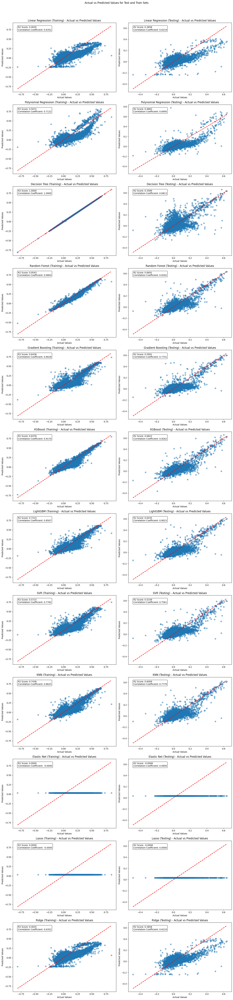

In [13]:
# Plot Actual vs Predicted Values for Test and Train
# fig, axs = plt.subplots(len(models) + 1, 2, figsize=(15, 5 * (len(models) + 1)))
fig, axs = plt.subplots(len(models), 2, figsize=(15, 5 * (len(models) + 1)))
fig.suptitle('Actual vs Predicted Values for Test and Train Sets')

for i, (name, model) in enumerate(models.items()):
    plot_actual_vs_predicted(axs[i, 0], y_train, model.predict(X_train_scaled), f'{name} (Training)')
    plot_actual_vs_predicted(axs[i, 1], y_test, model.predict(X_test_scaled), f'{name} (Testing)')


# plot_actual_vs_predicted(axs[len(models), 0], y_test, y_pred_test_nn, 'Neural Network (Test)')
# plot_actual_vs_predicted(axs[len(models), 1], y_train, y_pred_train_nn, 'Neural Network (Train)')

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()



[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 1494, number of used features: 4
[LightGBM] [Info] Start training from score 0.030407
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 4856, number of used features: 4
[LightGBM] [Info] Start training from score 0.030371
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 8218, number of used features: 4
[LightGBM] [Info] Start training 

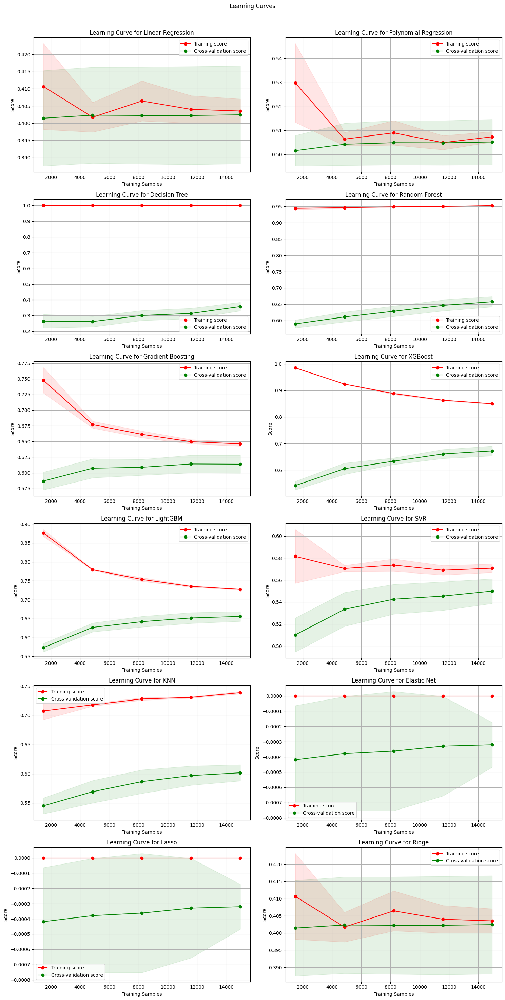

In [14]:
# Plot Learning Curves
fig, axs = plt.subplots((len(models)) // 2, 2, figsize=(15, 5 * ((len(models)) // 2)))
fig.suptitle('Learning Curves')

for i, (name, model) in enumerate(models.items()):
    plot_learning_curve(axs[i // 2, i % 2], model, f'Learning Curve for {name}', X_train_scaled, y_train, cv=5)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()



In [15]:
# Create comparison table
data = []
for model in results:
    row = {'Model': model}
    for split in ['Test', 'Train']:
        for metric in ['MSE', 'MAE', 'RMSE', 'R2', 'Correlation']:
            row[f'{split}_{metric}'] = results[model][split][metric]
    data.append(row)

comparison_table = pd.DataFrame(data)

# Set index
comparison_table = comparison_table.set_index('Model')

# Sort by Test MSE
comparison_table = comparison_table.sort_values('Test_MSE')

# Reorder columns
column_order = ['Test_MSE', 'Test_MAE', 'Test_RMSE', 'Test_R2', 'Test_Correlation',
                'Train_MSE', 'Train_MAE', 'Train_RMSE', 'Train_R2', 'Train_Correlation']
comparison_table = comparison_table[column_order]

# Add multi-level column index
comparison_table.columns = pd.MultiIndex.from_product([['Test', 'Train'], ['MSE', 'MAE', 'RMSE', 'R2', 'Correlation']])

# Save the table to a CSV file
comparison_table.to_csv('model_comparison_00.csv')

comparison_table


Test                                              \
                            MSE       MAE      RMSE        R2   Correlation   
Model                                                                         
XGBoost                0.003289  0.039082  0.057349  0.682245  8.262447e-01   
Random Forest          0.003425  0.038832  0.058524  0.669089  8.181023e-01   
LightGBM               0.003690  0.041444  0.060743  0.643521  8.022624e-01   
KNN                    0.004131  0.043346  0.064272  0.600899  7.778700e-01   
Gradient Boosting      0.004150  0.044506  0.064420  0.599062  7.740641e-01   
SVR                    0.004824  0.054071  0.069457  0.533904  7.560718e-01   
Polynomial Regression  0.005296  0.053111  0.072776  0.488295  6.994897e-01   
Ridge                  0.006358  0.060466  0.079734  0.385776  6.218622e-01   
Linear Regression      0.006358  0.060467  0.079734  0.385774  6.218621e-01   
Decision Tree          0.006635  0.052166  0.081458  0.358922  6.812717e-01   
Elastic Net            0.010359  0.066834  0.101777 -0.000790  1.215114e-17   
Lasso                  0.010359  0.066834  0.101777 -0.000790  1.215114e-17   

                              Train                                \
                                MSE       MAE      RMSE        R2   
Model                                                               
XGBoost                1.751885e-03  0.029901  0.041856  0.837591   
Random Forest          4.932464e-04  0.014803  0.022209  0.954273   
LightGBM               3.004090e-03  0.038608  0.054810  0.721505   
KNN                    2.765712e-03  0.035751  0.052590  0.743604   
Gradient Boosting      3.844203e-03  0.044078  0.062002  0.643622   
SVR                    4.622071e-03  0.054125  0.067986  0.571510   
Polynomial Regression  5.315710e-03  0.054281  0.072909  0.507206   
Ridge                  6.434191e-03  0.061676  0.080213  0.403517   
Linear Regression      6.434191e-03  0.061676  0.080213  0.403517   
Decision Tree          9.460960e-08  0.000004  0.000308  0.999991   
Elastic Net            1.078688e-02  0.068196  0.103860  0.000000   
Lasso                  1.078688e-02  0.068196  0.103860  0.000000   

                                     
                        Correlation  
Model                                
XGBoost                9.170500e-01  
Random Forest          9.804455e-01  
LightGBM               8.507423e-01  
KNN                    8.624969e-01  
Gradient Boosting      8.027877e-01  
SVR                    7.782496e-01  
Polynomial Regression  7.121838e-01  
Ridge                  6.352296e-01  
Linear Regression      6.352296e-01  
Decision Tree          9.999956e-01  
Elastic Net           -4.468078e-17  
Lasso                 -4.468078e-17

# **Checking For Feature Importance**

In [16]:
# Train the models and gather feature importance
feature_importance = {}
models_without_importance = []

for name, model in models.items():
    model.fit(X_train_scaled, y_train)

    if hasattr(model, 'feature_importances_'):
        # Tree-based models
        feature_importance[name] = model.feature_importances_
    elif hasattr(model, 'coef_'):
        # Linear models
        feature_importance[name] = model.coef_
    elif hasattr(model, 'get_booster'):
        # XGBoost
        booster = model.get_booster()
        fscore = booster.get_score(importance_type='gain')
        importance = np.zeros(X_train_scaled.shape[1])
        for key, value in fscore.items():
            importance[int(key[1:])] = value
        feature_importance[name] = importance
    else:
        models_without_importance.append(name)



[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 18679, number of used features: 4
[LightGBM] [Info] Start training from score 0.033035


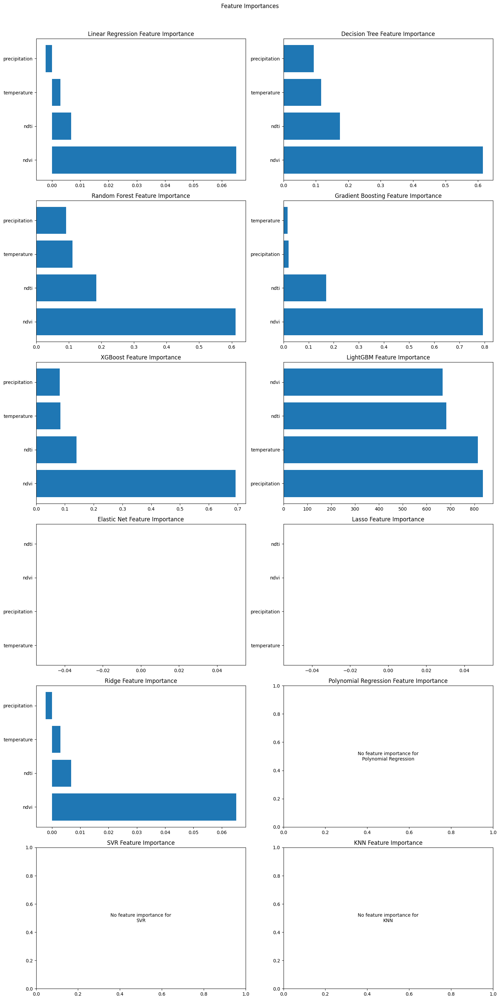

In [17]:
# Plotting the feature importances
num_models = len(models)  # Total number of models
num_cols = 2
num_rows = (num_models + 1) // num_cols + ((num_models + 1) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()
fig.suptitle('Feature Importances')

# Plot feature importances for models that have them
for i, (name, importance) in enumerate(feature_importance.items()):
    sorted_idx = np.argsort(importance)
    sorted_features = X_train.columns[sorted_idx]
    sorted_importance = importance[sorted_idx]
    axes[i].barh(sorted_features, sorted_importance)
    axes[i].set_title(f'{name} Feature Importance')
    axes[i].invert_yaxis()

# Add placeholders for models without feature importance
for j, name in enumerate(models_without_importance, start=i + 1):
    axes[j].text(0.5, 0.5, f'No feature importance for\n{name}', horizontalalignment='center', verticalalignment='center')
    axes[j].set_title(f'{name} Feature Importance')

# Remove any remaining unused subplots
for k in range(j + 1, len(axes)):
    axes[k].set_visible(False)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


### *ALL MODELS WILL BE PLOTED IN 4 PER ROWS*

In [18]:
# Set up the plots
num_models = len(models)
fig, axs = plt.subplots(num_models, 4, figsize=(20, 5 * num_models))
fig.suptitle('Model Analysis: Actual vs Predicted, Learning Curves, and Feature Importances')

for i, (name, model) in enumerate(models.items()):
    # Plot Actual vs Predicted for Train
    plot_actual_vs_predicted(axs[i, 0], y_train, model.predict(X_train_scaled), f'{name} (Train)')

    # Plot Actual vs Predicted for Test
    plot_actual_vs_predicted(axs[i, 1], y_test, model.predict(X_test_scaled), f'{name} (Test)')

    # Plot Learning Curves
    plot_learning_curve(axs[i, 2], model, f'Learning Curve for {name}', X_train_scaled, y_train, cv=5)

    # Plot Feature Importances
    if name in feature_importance:
        importance = feature_importance[name]
        sorted_idx = np.argsort(importance)
        sorted_features = X_train.columns[sorted_idx]
        sorted_importance = importance[sorted_idx]
        axs[i, 3].barh(sorted_features, sorted_importance)
        axs[i, 3].set_title(f'{name} Feature Importance')
        axs[i, 3].invert_yaxis()
    else:
        axs[i, 3].text(0.5, 0.5, f'No feature importance for\n{name}', horizontalalignment='center', verticalalignment='center')
        axs[i, 3].set_title(f'{name} Feature Importance')

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


Output hidden; open in https://colab.research.google.com to view.

### **Model To Predict Using Target Variable and Variable Features Without Best Performimg Feature(NDVI)**
Since we already know how well the machine learning models performed using NDVI we will like to see how they perform without NDVI.

In [19]:
# Remove 'ndvi' feature
X = data23[['ndti', 'precipitation', 'temperature']]
y = data23['ndci']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [20]:
# Train and evaluate models
for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred_train = model.predict(X_train_scaled)
    y_pred_test = model.predict(X_test_scaled)

    results[name] = {
        'Train': calculate_metrics(y_train, y_pred_train),
        'Test': calculate_metrics(y_test, y_pred_test)
    }

    # plot_actual_vs_predicted(y_test, y_pred_test, f'{name} (Test)')
    # plot_actual_vs_predicted(y_train, y_pred_train, f'{name} (Train)')

    # if hasattr(model, 'predict'):
    #     plot_learning_curve(model, f"Learning Curve for {name}", X_train_scaled, y_train, cv=5)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 18679, number of used features: 3
[LightGBM] [Info] Start training from score 0.033035


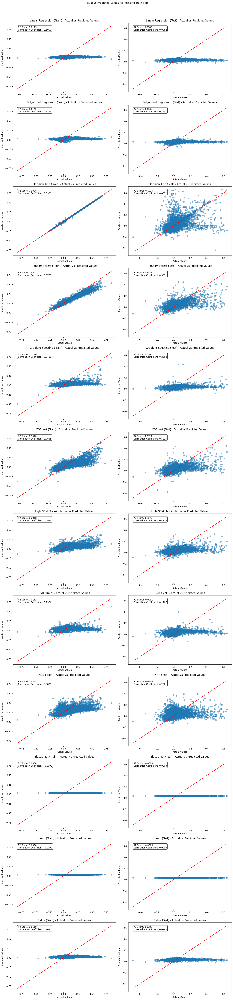

In [21]:
# Plot Actual vs Predicted Values for Test and Train
# fig, axs = plt.subplots(len(models) + 1, 2, figsize=(15, 5 * (len(models) + 1)))
fig, axs = plt.subplots(len(models), 2, figsize=(15, 5 * (len(models) + 1)))
fig.suptitle('Actual vs Predicted Values for Test and Train Sets')

for i, (name, model) in enumerate(models.items()):
    plot_actual_vs_predicted(axs[i, 0], y_train, model.predict(X_train_scaled), f'{name} (Train)')
    plot_actual_vs_predicted(axs[i, 1], y_test, model.predict(X_test_scaled), f'{name} (Test)')


# plot_actual_vs_predicted(axs[len(models), 0], y_test, y_pred_test_nn, 'Neural Network (Test)')
# plot_actual_vs_predicted(axs[len(models), 1], y_train, y_pred_train_nn, 'Neural Network (Train)')

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1494, number of used features: 3
[LightGBM] [Info] Start training from score 0.030407
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 4856, number of used features: 3
[LightGBM] [Info] Start training from score 0.030371
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 8218, number of used features: 3
[LightGBM] [Info] Start training fro

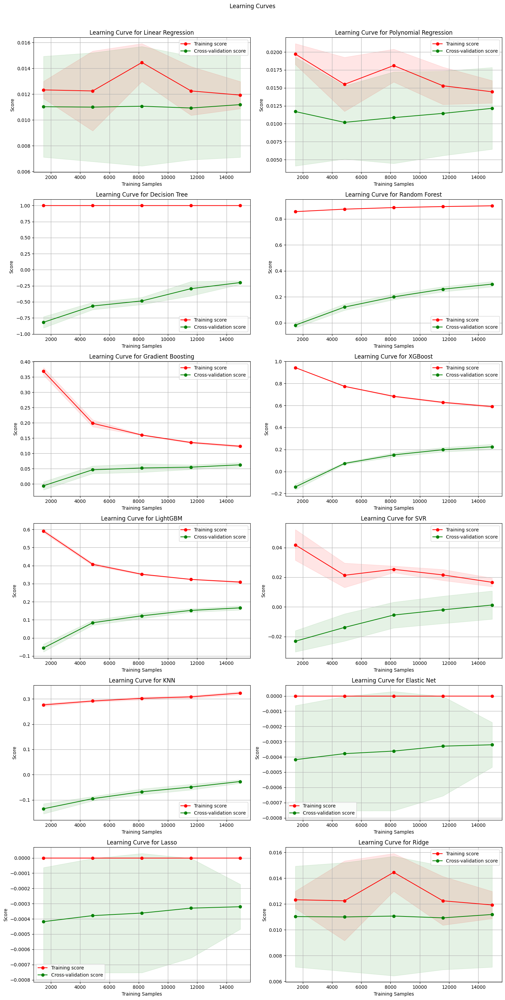

In [22]:
# Plot Learning Curves
fig, axs = plt.subplots((len(models)) // 2, 2, figsize=(15, 5 * ((len(models)) // 2)))
fig.suptitle('Learning Curves')

for i, (name, model) in enumerate(models.items()):
    plot_learning_curve(axs[i // 2, i % 2], model, f'Learning Curve for {name}', X_train_scaled, y_train, cv=5)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()



In [23]:
# Create comparison table
data = []
for model in results:
    row = {'Model': model}
    for split in ['Test', 'Train']:
        for metric in ['MSE', 'MAE', 'RMSE', 'R2', 'Correlation']:
            row[f'{split}_{metric}'] = results[model][split][metric]
    data.append(row)

comparison_table = pd.DataFrame(data)

# Set index
comparison_table = comparison_table.set_index('Model')

# Sort by Test MSE
comparison_table = comparison_table.sort_values('Test_MSE')

# Reorder columns
column_order = ['Test_MSE', 'Test_MAE', 'Test_RMSE', 'Test_R2', 'Test_Correlation',
                'Train_MSE', 'Train_MAE', 'Train_RMSE', 'Train_R2', 'Train_Correlation']
comparison_table = comparison_table[column_order]

# Add multi-level column index
comparison_table.columns = pd.MultiIndex.from_product([['Test', 'Train'], ['MSE', 'MAE', 'RMSE', 'R2', 'Correlation']])

# Display the table
# print(comparison_table)

# Save the table to a CSV file
comparison_table.to_csv('model_comparison_no_ndvi.csv')

comparison_table

Test                                              \
                            MSE       MAE      RMSE        R2   Correlation   
Model                                                                         
Random Forest          0.007116  0.051324  0.084358  0.312475  5.591088e-01   
XGBoost                0.007738  0.056190  0.087968  0.252360  5.024562e-01   
LightGBM               0.008613  0.060245  0.092806  0.167868  4.173834e-01   
Gradient Boosting      0.009662  0.064247  0.098296  0.066501  2.667974e-01   
Polynomial Regression  0.010209  0.066071  0.101038  0.013708  1.201076e-01   
Ridge                  0.010260  0.066190  0.101289  0.008786  9.822640e-02   
Linear Regression      0.010260  0.066190  0.101289  0.008786  9.822646e-02   
Elastic Net            0.010359  0.066834  0.101777 -0.000790  1.215114e-17   
Lasso                  0.010359  0.066834  0.101777 -0.000790  1.215114e-17   
SVR                    0.010444  0.072478  0.102198 -0.009078  1.707478e-01   
KNN                    0.010816  0.067477  0.104000 -0.044975  2.261273e-01   
Decision Tree          0.012332  0.061996  0.111051 -0.191466  4.032244e-01   

                          Train                                              
                            MSE       MAE      RMSE        R2   Correlation  
Model                                                                        
Random Forest          0.000980  0.018951  0.031308  0.909128  9.738585e-01  
XGBoost                0.004735  0.045443  0.068812  0.561034  7.835425e-01  
LightGBM               0.007640  0.057272  0.087405  0.291764  5.932668e-01  
Gradient Boosting      0.009585  0.064198  0.097902  0.111440  3.709553e-01  
Polynomial Regression  0.010633  0.067196  0.103118  0.014236  1.193136e-01  
Ridge                  0.010659  0.067346  0.103242  0.011871  1.089523e-01  
Linear Regression      0.010659  0.067346  0.103242  0.011871  1.089523e-01  
Elastic Net            0.010787  0.068196  0.103860  0.000000 -4.468078e-17  
Lasso                  0.010787  0.068196  0.103860  0.000000 -4.468078e-17  
SVR                    0.010612  0.072580  0.103013  0.016235  1.996321e-01  
KNN                    0.007164  0.054323  0.084642  0.335838  5.807713e-01  
Decision Tree          0.000002  0.000049  0.001343  0.999833  9.999164e-01

# **FEATURE IMPORTANCE**
**Check For The Best Performing Variable After The New Model Using Feature Importance.**

In [24]:
# Train the models to gather feature importance
feature_importance = {}
models_without_importance = []

for name, model in models.items():
    model.fit(X_train_scaled, y_train)

    if hasattr(model, 'feature_importances_'):
        # Tree-based models
        feature_importance[name] = model.feature_importances_
    elif hasattr(model, 'coef_'):
        # Linear models
        feature_importance[name] = model.coef_
    elif hasattr(model, 'get_booster'):
        # XGBoost
        booster = model.get_booster()
        fscore = booster.get_score(importance_type='gain')
        importance = np.zeros(X_train_scaled.shape[1])
        for key, value in fscore.items():
            importance[int(key[1:])] = value
        feature_importance[name] = importance
    else:
        models_without_importance.append(name)



[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 18679, number of used features: 3
[LightGBM] [Info] Start training from score 0.033035


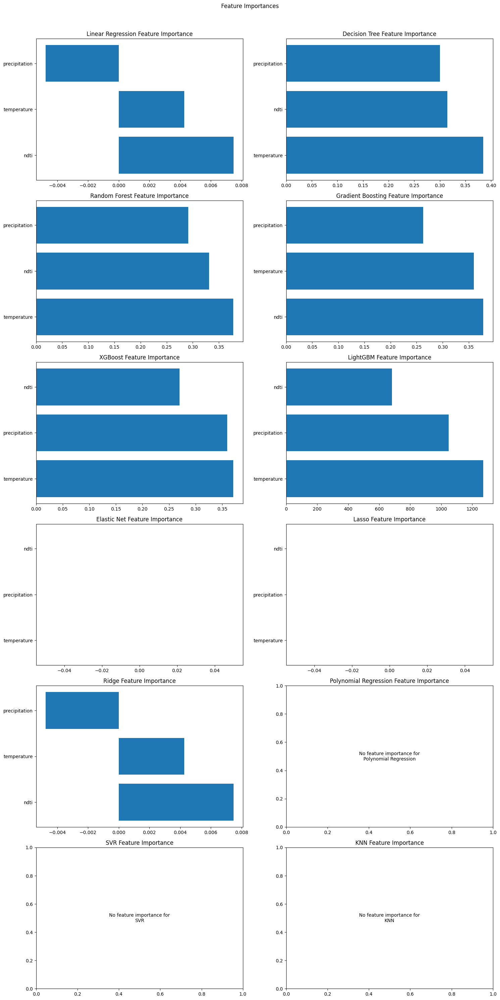

In [25]:
# Plotting the feature importances
num_models = len(models)  # Total number of models
num_cols = 2
num_rows = (num_models + 1) // num_cols + ((num_models + 1) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()
fig.suptitle('Feature Importances')

# Plot feature importances for models that have them
for i, (name, importance) in enumerate(feature_importance.items()):
    sorted_idx = np.argsort(importance)
    sorted_features = X_train.columns[sorted_idx]
    sorted_importance = importance[sorted_idx]
    axes[i].barh(sorted_features, sorted_importance)
    axes[i].set_title(f'{name} Feature Importance')
    axes[i].invert_yaxis()

# Add placeholders for models without feature importance
for j, name in enumerate(models_without_importance, start=i + 1):
    axes[j].text(0.5, 0.5, f'No feature importance for\n{name}', horizontalalignment='center', verticalalignment='center')
    axes[j].set_title(f'{name} Feature Importance')

# Remove any remaining unused subplots
for k in range(j + 1, len(axes)):
    axes[k].set_visible(False)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


### *ALL MODELS WILL BE PLOTED IN 4 PER ROWS*

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1494, number of used features: 3
[LightGBM] [Info] Start training from score 0.030407
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 4856, number of used features: 3
[LightGBM] [Info] Start training from score 0.030371
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 8218, number of used features: 3
[LightGBM] [Info] Start training fro

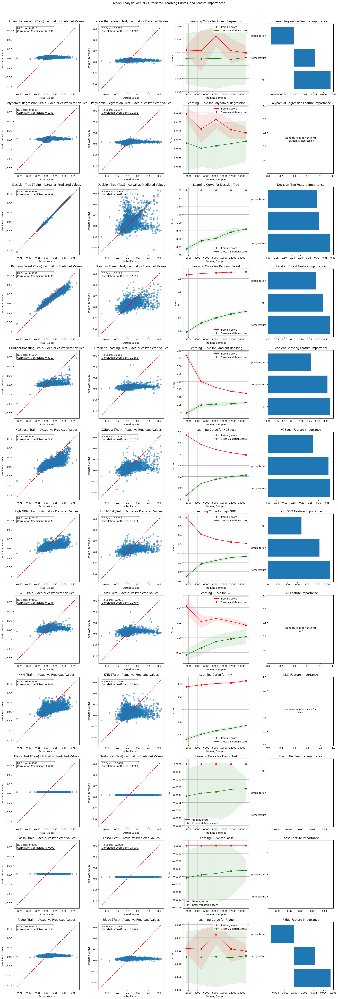

In [26]:
# Set up the plots
num_models = len(models)
fig, axs = plt.subplots(num_models, 4, figsize=(20, 5 * num_models))
fig.suptitle('Model Analysis: Actual vs Predicted, Learning Curves, and Feature Importances')

for i, (name, model) in enumerate(models.items()):
    # Plot Actual vs Predicted for Train
    plot_actual_vs_predicted(axs[i, 0], y_train, model.predict(X_train_scaled), f'{name} (Train)')

    # Plot Actual vs Predicted for Test
    plot_actual_vs_predicted(axs[i, 1], y_test, model.predict(X_test_scaled), f'{name} (Test)')

    # Plot Learning Curves
    plot_learning_curve(axs[i, 2], model, f'Learning Curve for {name}', X_train_scaled, y_train, cv=5)

    # Plot Feature Importances
    if name in feature_importance:
        importance = feature_importance[name]
        sorted_idx = np.argsort(importance)
        sorted_features = X_train.columns[sorted_idx]
        sorted_importance = importance[sorted_idx]
        axs[i, 3].barh(sorted_features, sorted_importance)
        axs[i, 3].set_title(f'{name} Feature Importance')
        axs[i, 3].invert_yaxis()
    else:
        axs[i, 3].text(0.5, 0.5, f'No feature importance for\n{name}', horizontalalignment='center', verticalalignment='center')
        axs[i, 3].set_title(f'{name} Feature Importance')

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


### **Using The Best Performing Feature As the Only Feature Against NDCI In The Models**

In [27]:
# Remove 'ndvi' feature
X = data23[['ndvi']]
y = data23['ndci']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



# Train and evaluate models
for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred_train = model.predict(X_train_scaled)
    y_pred_test = model.predict(X_test_scaled)

    results[name] = {
        'Train': calculate_metrics(y_train, y_pred_train),
        'Test': calculate_metrics(y_test, y_pred_test)
    }




[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 18679, number of used features: 1
[LightGBM] [Info] Start training from score 0.033035


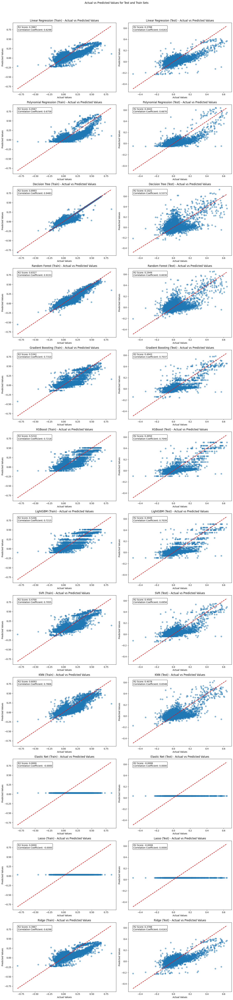

In [28]:
# Plot Actual vs Predicted Values for Test and Train
# fig, axs = plt.subplots(len(models) + 1, 2, figsize=(15, 5 * (len(models) + 1)))
fig, axs = plt.subplots(len(models), 2, figsize=(15, 5 * (len(models) + 1)))
fig.suptitle('Actual vs Predicted Values for Test and Train Sets')

for i, (name, model) in enumerate(models.items()):
    plot_actual_vs_predicted(axs[i, 0], y_train, model.predict(X_train_scaled), f'{name} (Train)')
    plot_actual_vs_predicted(axs[i, 1], y_test, model.predict(X_test_scaled), f'{name} (Test)')


# plot_actual_vs_predicted(axs[len(models), 0], y_test, y_pred_test_nn, 'Neural Network (Test)')
# plot_actual_vs_predicted(axs[len(models), 1], y_train, y_pred_train_nn, 'Neural Network (Train)')

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 1494, number of used features: 1
[LightGBM] [Info] Start training from score 0.030407
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 4856, number of used features: 1
[LightGBM] [Info] Start training from score 0.030371
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 8218, number of used features: 1
[LightGBM] [Info] Start training fro

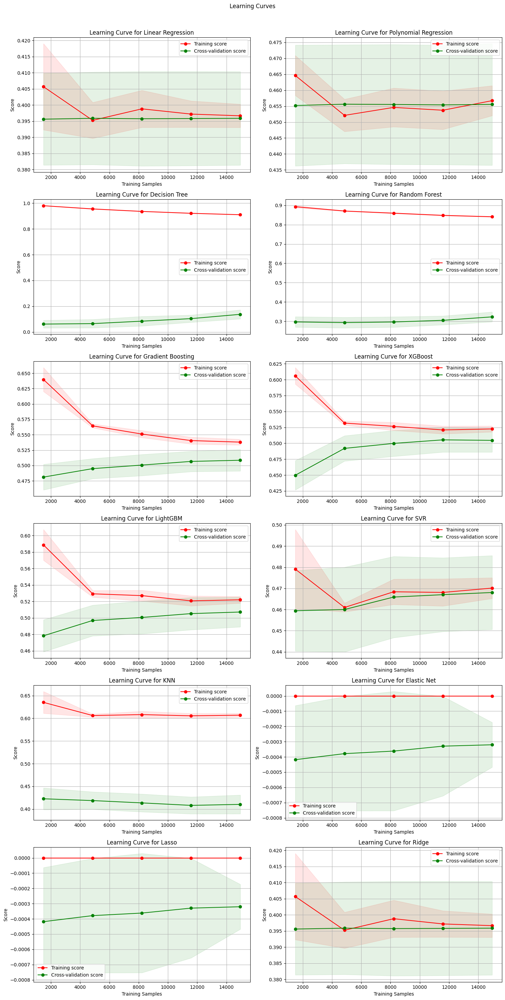

In [29]:
# Plot Learning Curves
fig, axs = plt.subplots((len(models)) // 2, 2, figsize=(15, 5 * ((len(models)) // 2)))
fig.suptitle('Learning Curves')

for i, (name, model) in enumerate(models.items()):
    plot_learning_curve(axs[i // 2, i % 2], model, f'Learning Curve for {name}', X_train_scaled, y_train, cv=5)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

In [30]:
# Create comparison table
data = []
for model in results:
    row = {'Model': model}
    for split in ['Test', 'Train']:
        for metric in ['MSE', 'MAE', 'RMSE', 'R2', 'Correlation']:
            row[f'{split}_{metric}'] = results[model][split][metric]
    data.append(row)

comparison_table = pd.DataFrame(data)

# Set index
comparison_table = comparison_table.set_index('Model')

# Sort by Test MSE
comparison_table = comparison_table.sort_values('Test_MSE')

# Reorder columns
column_order = ['Test_MSE', 'Test_MAE', 'Test_RMSE', 'Test_R2', 'Test_Correlation',
                'Train_MSE', 'Train_MAE', 'Train_RMSE', 'Train_R2', 'Train_Correlation']
comparison_table = comparison_table[column_order]

# Add multi-level column index
comparison_table.columns = pd.MultiIndex.from_product([['Test', 'Train'], ['MSE', 'MAE', 'RMSE', 'R2', 'Correlation']])

# Display the table
# print(comparison_table)

# Save the table to a CSV file
comparison_table.to_csv('model_comparison_ndvi_and_ndci_only.csv')

comparison_table

Test                                              \
                            MSE       MAE      RMSE        R2   Correlation   
Model                                                                         
XGBoost                0.005227  0.052025  0.072298  0.494995  7.040105e-01   
LightGBM               0.005228  0.051983  0.072308  0.494865  7.038666e-01   
Gradient Boosting      0.005234  0.052075  0.072348  0.494295  7.036886e-01   
SVR                    0.005688  0.059480  0.075418  0.450472  6.955710e-01   
Polynomial Regression  0.005752  0.057112  0.075842  0.444274  6.670406e-01   
KNN                    0.006129  0.056890  0.078290  0.407825  6.547518e-01   
Ridge                  0.006429  0.062150  0.080183  0.378837  6.163187e-01   
Linear Regression      0.006429  0.062150  0.080183  0.378835  6.163187e-01   
Random Forest          0.007298  0.061100  0.085427  0.294932  6.030245e-01   
Decision Tree          0.009294  0.068370  0.096405  0.102084  5.373276e-01   
Elastic Net            0.010359  0.066834  0.101777 -0.000790  1.215114e-17   
Lasso                  0.010359  0.066834  0.101777 -0.000790  1.215114e-17   

                          Train                                              
                            MSE       MAE      RMSE        R2   Correlation  
Model                                                                        
XGBoost                0.005167  0.052793  0.071881  0.521010  7.218102e-01  
LightGBM               0.005172  0.052769  0.071914  0.520559  7.214985e-01  
Gradient Boosting      0.005024  0.052297  0.070883  0.534208  7.309965e-01  
SVR                    0.005717  0.060495  0.075612  0.469981  7.054625e-01  
Polynomial Regression  0.005861  0.058291  0.076554  0.456701  6.757962e-01  
KNN                    0.004214  0.047766  0.064919  0.609301  7.806079e-01  
Ridge                  0.006508  0.063350  0.080672  0.396672  6.298187e-01  
Linear Regression      0.006508  0.063351  0.080672  0.396672  6.298187e-01  
Random Forest          0.001805  0.030267  0.042481  0.832699  9.153151e-01  
Decision Tree          0.001086  0.015843  0.032956  0.899311  9.483203e-01  
Elastic Net            0.010787  0.068196  0.103860  0.000000 -4.468078e-17  
Lasso                  0.010787  0.068196  0.103860  0.000000 -4.468078e-17

## **Check How Good The Feature Importance For NDVI**

In [31]:
# Train the models to gather feature importance
feature_importance = {}
models_without_importance = []

for name, model in models.items():
    model.fit(X_train_scaled, y_train)

    if hasattr(model, 'feature_importances_'):
        # Tree-based models
        feature_importance[name] = model.feature_importances_
    elif hasattr(model, 'coef_'):
        # Linear models
        feature_importance[name] = model.coef_
    elif hasattr(model, 'get_booster'):
        # XGBoost
        booster = model.get_booster()
        fscore = booster.get_score(importance_type='gain')
        importance = np.zeros(X_train_scaled.shape[1])
        for key, value in fscore.items():
            importance[int(key[1:])] = value
        feature_importance[name] = importance
    else:
        models_without_importance.append(name)



[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 18679, number of used features: 1
[LightGBM] [Info] Start training from score 0.033035


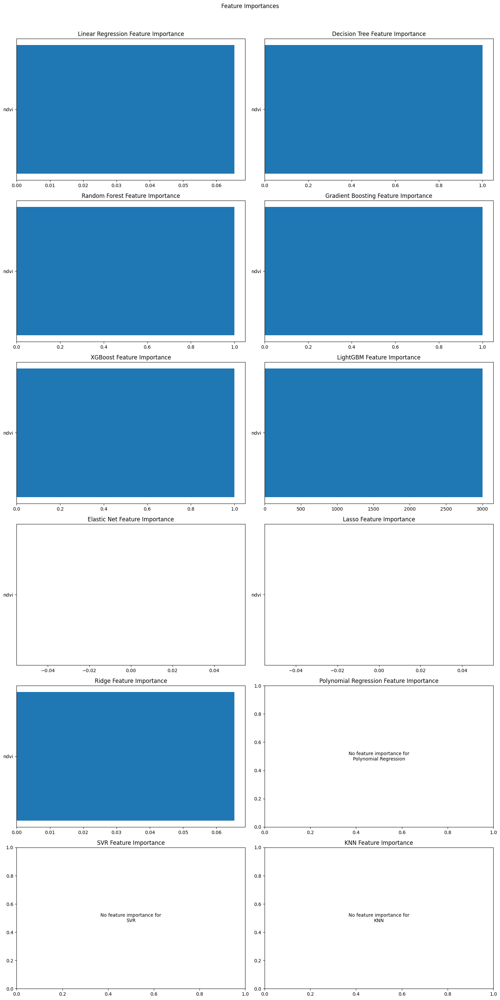

In [32]:
# Plotting the feature importances
num_models = len(models)  # Total number of models
num_cols = 2
num_rows = (num_models + 1) // num_cols + ((num_models + 1) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()
fig.suptitle('Feature Importances')

# Plot feature importances for models that have them
for i, (name, importance) in enumerate(feature_importance.items()):
    sorted_idx = np.argsort(importance)
    sorted_features = X_train.columns[sorted_idx]
    sorted_importance = importance[sorted_idx]
    axes[i].barh(sorted_features, sorted_importance)
    axes[i].set_title(f'{name} Feature Importance')
    axes[i].invert_yaxis()

# Add placeholders for models without feature importance
for j, name in enumerate(models_without_importance, start=i + 1):
    axes[j].text(0.5, 0.5, f'No feature importance for\n{name}', horizontalalignment='center', verticalalignment='center')
    axes[j].set_title(f'{name} Feature Importance')

# Remove any remaining unused subplots
for k in range(j + 1, len(axes)):
    axes[k].set_visible(False)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

In [33]:
# Set up the plots
num_models = len(models)
fig, axs = plt.subplots(num_models, 4, figsize=(20, 5 * num_models))
fig.suptitle('Model Analysis: Actual vs Predicted, Learning Curves, and Feature Importances')

for i, (name, model) in enumerate(models.items()):
    # Plot Actual vs Predicted for Train
    plot_actual_vs_predicted(axs[i, 0], y_train, model.predict(X_train_scaled), f'{name} (Train)')

    # Plot Actual vs Predicted for Test
    plot_actual_vs_predicted(axs[i, 1], y_test, model.predict(X_test_scaled), f'{name} (Test)')

    # Plot Learning Curves
    plot_learning_curve(axs[i, 2], model, f'Learning Curve for {name}', X_train_scaled, y_train, cv=5)

    # Plot Feature Importances
    if name in feature_importance:
        importance = feature_importance[name]
        sorted_idx = np.argsort(importance)
        sorted_features = X_train.columns[sorted_idx]
        sorted_importance = importance[sorted_idx]
        axs[i, 3].barh(sorted_features, sorted_importance)
        axs[i, 3].set_title(f'{name} Feature Importance')
        axs[i, 3].invert_yaxis()
    else:
        axs[i, 3].text(0.5, 0.5, f'No feature importance for\n{name}', horizontalalignment='center', verticalalignment='center')
        axs[i, 3].set_title(f'{name} Feature Importance')

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# CODE BY
# SULAIMAN ADELEYE

In [ ]:
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################

In [ ]:
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################

In [ ]:
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################